Find the two possible different best fits from the original fiducial model

In [3]:
from escripts import edata
from escripts import eMCMC
from escripts import eplots
from matplotlib.gridspec import GridSpec
import math
import emcee
import dataframe_image as dfi
from collections import OrderedDict
import corner
from matplotlib.transforms import Bbox
from matplotlib import ticker

In [4]:
folder = '/Users/eb35267/Desktop/code/chains/fiducial_plus_mass'
file_name = folder + '/samples.h5'

In [5]:
# Get data
file_names = ['/Users/eb35267/Desktop/code/home/data/Bouwens2021_low_z.txt',
               '/Users/eb35267/Desktop/code/home/data/Donnan24_limit_z.txt']
data_labels = ['Bouwens+21', 'Donnan+24']
sorted_data = edata.get_sorted(file_names, data_labels)

# Initialize parameters
params = eMCMC.build_param_data({'dsigdz':{'fit':True}, 'dsigdlogM':{'fit':True}, 'dlogMcdz':{'fit':True}})
    
    #'beta':{'fit': False, 'value':-0.431}, 
                                 #'dbetadz':{'fit':False, 'value':0.056}}) 

In [6]:
my_UVLF = eMCMC.UVLF(sorted_data, params)

In [7]:
ICs = eMCMC.get_narrowed_ICs(my_UVLF, backend_file = file_name)

In [8]:
ICs

(array([ 0.50891857, -0.9059955 , 11.98183722,  0.06313215, -0.75533969,
         0.11490374,  0.15903069, -0.37283397]),
 array([ 0.65204513, -0.50985404, 12.35940779,  0.12654824, -0.7103266 ,
         0.39638093,  0.35057149,  0.17310107]))

In [9]:
samples, best_fit, bounds, param_labels, log_prob = my_UVLF.get_fit(backend_file = file_name, return_log_prob=True)

# Corner plots

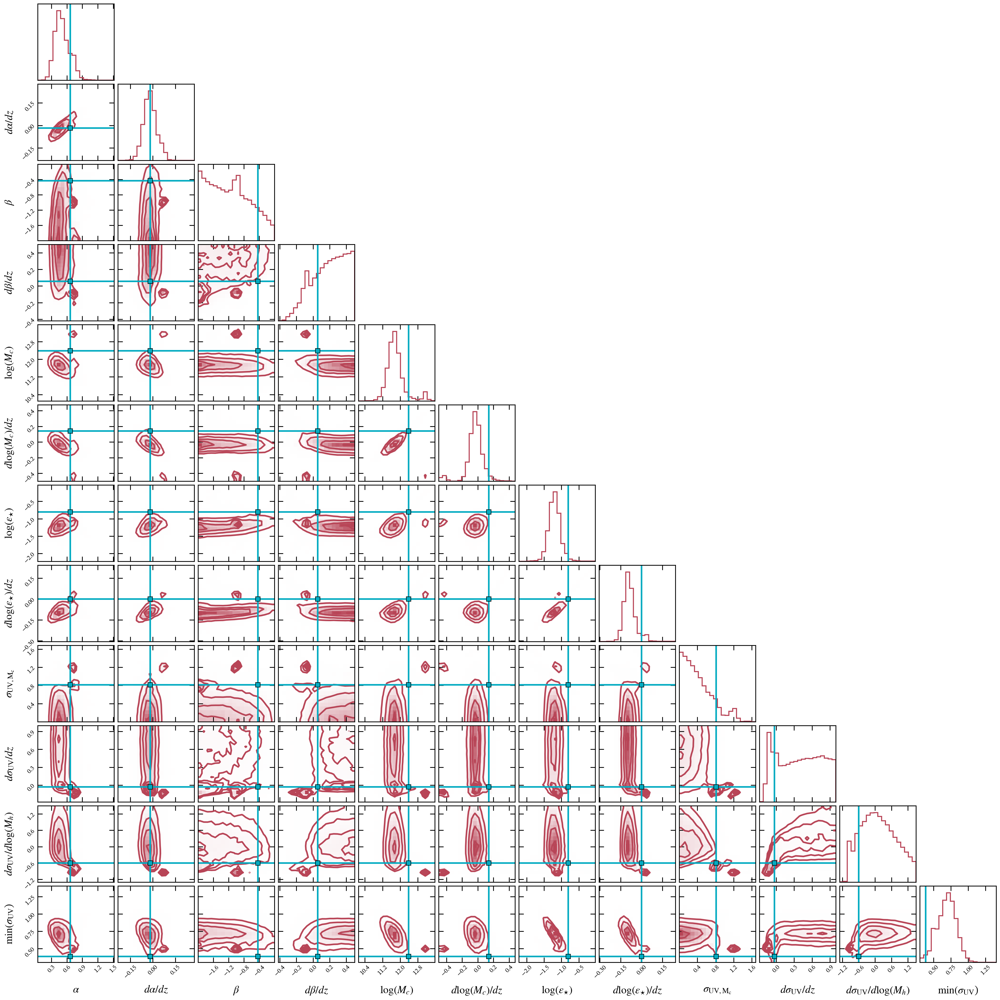

In [ ]:
fix_eps_fit = [0.664, -0.018, -0.431, 0.056, 12.386, 0.14, -0.806, 0, 0.813, -0.03, -0.598, 0.386]

corner_plot = eplots.make_corner(my_UVLF, backend_file = file_name, true_vals = fix_eps_fit)

In [36]:
corner_plot.savefig('/Users/eb35267/Desktop/code/figures/old_chain_new_best_fit.png')

In [13]:
dedz_params = eMCMC.build_param_data({'dlogedz':{'fit':False, 'value':0}})
dedz_UVLF = eMCMC.UVLF(sorted_data, dedz_params)

In [189]:
dedz_backend_file = '/Users/eb35267/Desktop/code/chains/just_HST_fix_deps/samples.h5'
dedz_samples, dedz_best_fit, _, dedz_labels, _= dedz_UVLF.get_fit(backend_file = dedz_backend_file, return_log_prob=True)

In [29]:
dedz_samples_fixed = np.insert(dedz_samples, 7, 0, axis=1) # Put in something outside the parameter range for the parameter that's not fit (in this case de/dz)

In [30]:
ranges[7]

(-0.3062112721418696, 0.24281356653493225)

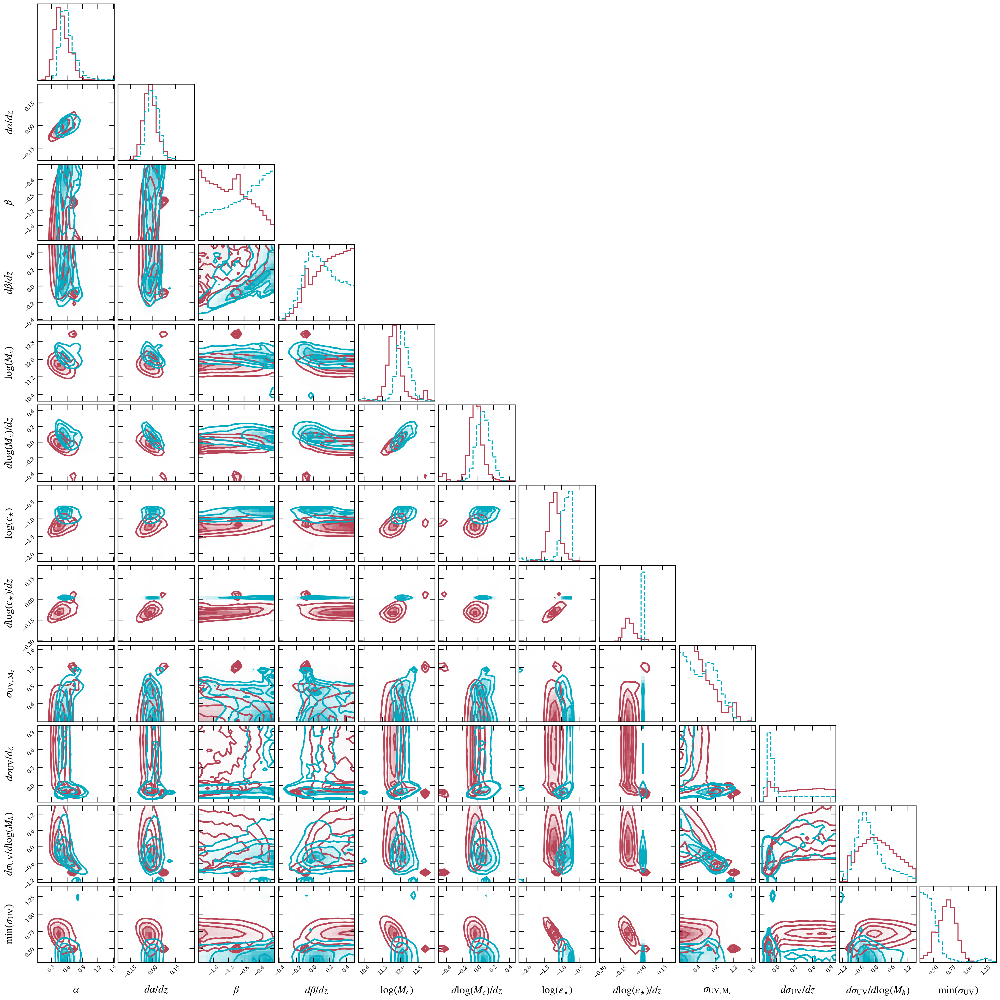

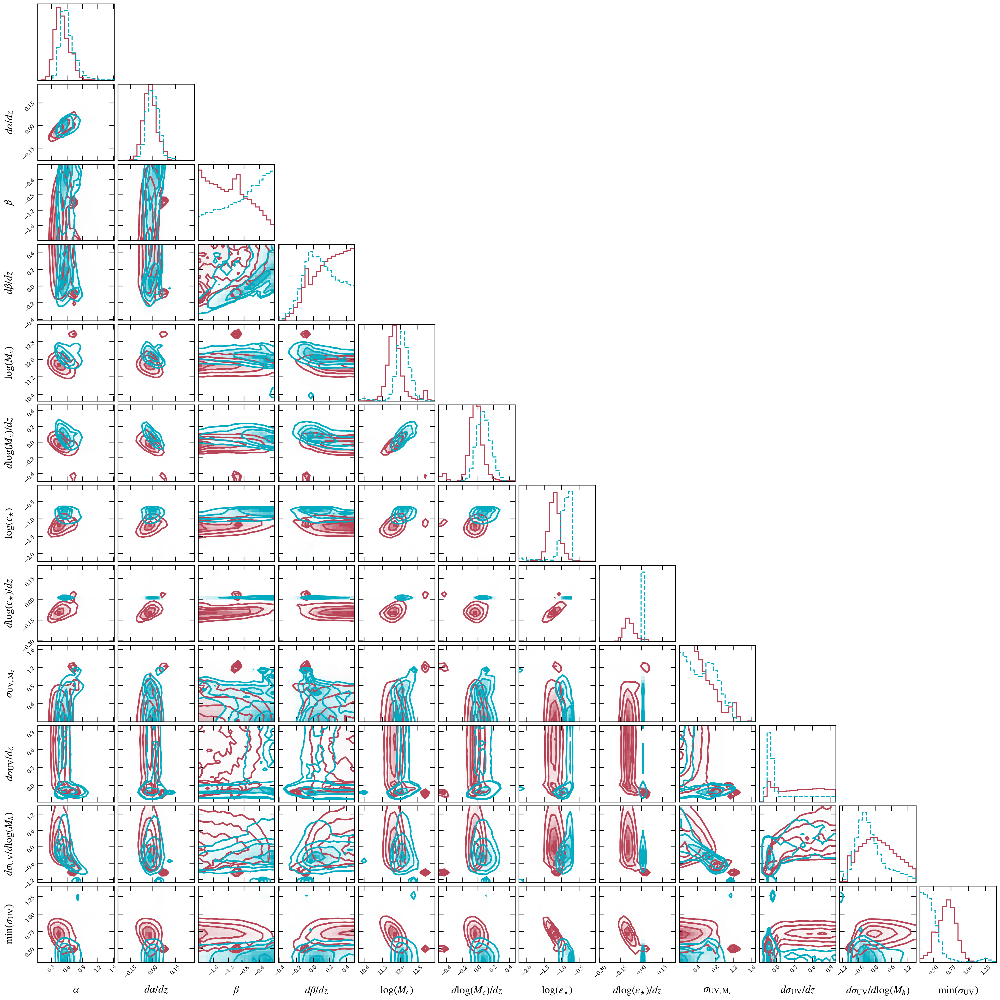

In [33]:
corner_plot = corner.corner(samples, labels=param_labels, color = eplots.red, plot_contours = True, plot_datapoints = False, hist_kwargs={'linewidth': 2})
corner.corner(dedz_samples_fixed, color = eplots.turquoise, plot_contours = True, plot_datapoints = False, hist_kwargs={'linewidth':2}, fig = corner_plot, range = ranges)


In [42]:
eMCMC.get_narrowed_ICs(backend_file = dedz_backend_file, my_UVLF = dedz_UVLF)

(array([ 0.49178485, -0.0393951 , -1.50245992, -0.09344819, 11.8526317 ,
        -0.01226819, -1.03939052,  0.13119473, -0.13389751, -0.69431832,
         0.34352793]),
 array([ 0.7744437 ,  0.04082842, -0.19992961,  0.34623598, 12.43945292,
         0.16550143, -0.75808065,  0.84597231,  0.56917616,  0.32007796,
         0.57169974]))

In [35]:
corner_plot.savefig('/Users/eb35267/Desktop/code/figures/beta_comparison/compare_full_corner.png')

# Walkers

In [23]:
prior_size = my_UVLF.uppers - my_UVLF.lowers

In [24]:
bf_no_dedz - 0.01*prior_size

ValueError: operands could not be broadcast together with shapes (12,) (14,) 

In [25]:
bf_no_dedz + 0.01*prior_size

ValueError: operands could not be broadcast together with shapes (12,) (14,) 

In [26]:
bf_no_dedz = [0.664, -0.018, -0.431, 0.056, 12.386, 0.140, -0.806, 0, 0.813, -0.030, -0.598, 0.386]

In [28]:
importlib.reload(eplots)

/Users/eb35267/Desktop/code/home/escripts/eplots.py:683: SyntaxWarning: invalid escape sequence '\s'
  ax.set_title(f'$z \simeq {z}$')


<module 'escripts.eplots' from '/Users/eb35267/Desktop/code/home/escripts/eplots.py'>

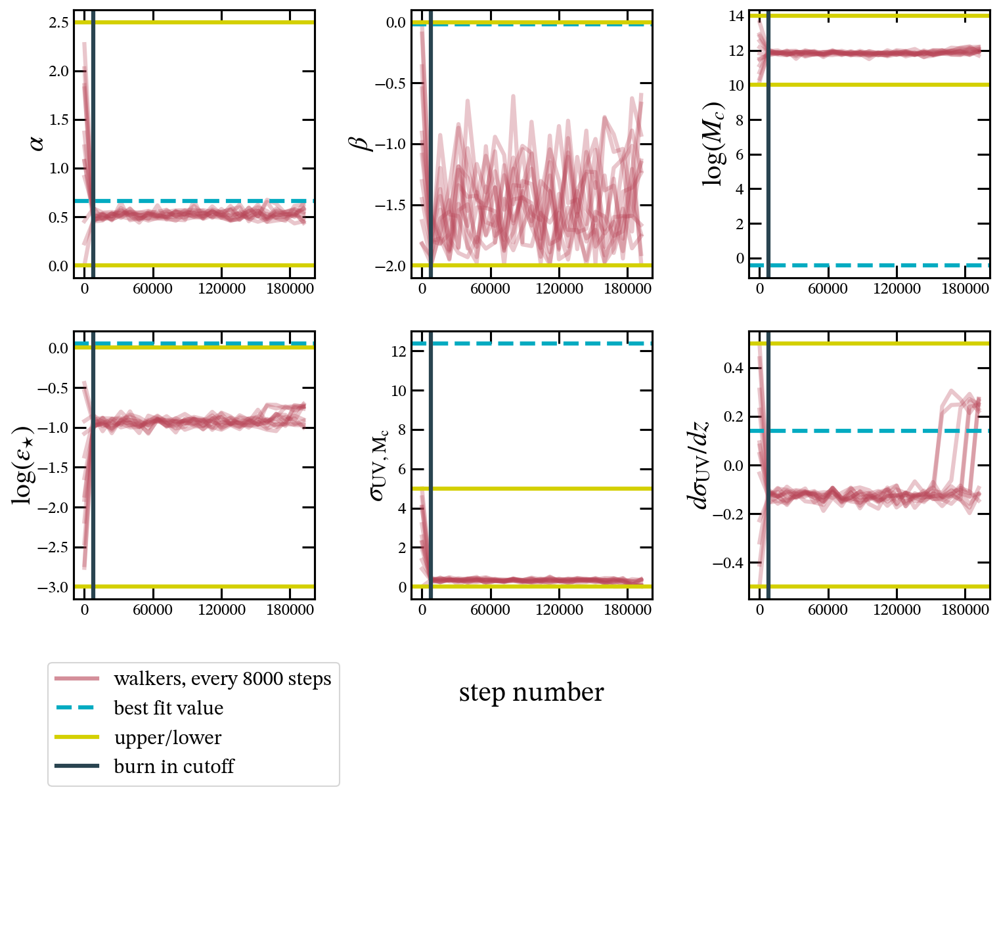

In [29]:
weird_walkers = eplots.walkers(my_UVLF, param_values = bf_no_dedz, backend_file = file_name)

In [51]:
def walkers(my_UVLF, param_values, backend_file = None, thin = 8000, burn_in = None, ncols = 3, include_params = None):
    """
    Plot MCMC walkers along with burn in cutoff & best fit parameter values and the imposed upper/lower limits
    Inputs:
        my_UVLF [eMCMC UVLF object]: UVLF object used for its methods such as applying time evolution to parameter values & wrapping them in the
                                        right format for zeus21
        param_values [1darray]: fit parameter values for comparison to walkers
        thin [int]: number of steps to thin the chains by (to make it easier to see the path in the plot)
        burn_in [int]: number of steps removed from each chain before they are used to calculate parameters
        ncols [int]: number of columns to use in plotting
    Return:
        fig showing the paths of each walker for each parameter with the burn in and best fit value shown along with upper/lower limits on the parameters
    """
    # Get walkers with no burn in
    if backend_file is None:
        walkers = my_UVLF.sampler.get_chain(discard = 0)
    else:
        reader = emcee.backends.HDFBackend(backend_file)
        walkers = reader.get_chain(discard = 0)

    # Get the standard burn in (for plotting purposes)
    if burn_in is None:
        burn_in = my_UVLF.burn_in

    # Thin the chain
    steps = np.arange(0, len(walkers[:,0][:,0]), thin)
    walkers = walkers[0::thin]

    fit_params= my_UVLF.param_data['fit'].values.astype(bool)
    lowers = my_UVLF.param_data['lower'][fit_params]
    uppers = my_UVLF.param_data['upper'][fit_params]
    labels = my_UVLF.param_data['label'][fit_params]
    if include_params is not None:
        include = my_UVLF.param_data[fit_params].index.isin(include_params)
        walkers = walkers[:,:, include]
        lowers = lowers[include]
        uppers = uppers[include]
        labels = labels[include]

    # Figure stuff
    nparams = walkers.shape[-1]
    fig = plt.figure()
    plt.subplots_adjust(wspace = 0.4, hspace = 0.2)
    gs = GridSpec(math.ceil((nparams+1)/ncols), ncols, figure=fig)
    
    axs = []
    for i, (lower, upper, label) in enumerate(zip(lowers, uppers, labels)): # Iterate through the parameters
        ax = fig.add_subplot(gs[math.floor(i/ncols), i%ncols]) # Add an axis for each parameter
        axs.append(ax)
        for j in range(len(walkers[i])):
            ax.plot(steps, walkers[:,j][:,i], color = red, ls = '-', alpha = 0.3) # Plot each walker for the given parameter
        ax.axhline(param_values[i], color = turquoise, ls = 'dashed', label = 'best fit value') # Plot the best fit value
        ax.axhline(lower, color = yellow, label = 'upper/lower')
        ax.axhline(upper, color = yellow)
        
        # Set label, ticks, etc.
        ax.set_ylabel(fr'{label}', labelpad = -0.6)
        ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=4))
        ax.axvline(burn_in, color = navy, ls = '-', label = 'burn in cutoff')
    
    # Labels, etc.
    ax.plot(0,0.3, color = red, ls = '-', alpha = 0.6, label = f'walkers, every {thin} steps') # get label

    multicol(gs, axs, xlabel = 'step number', ylabel = '', include_legend = True)
    
    return fig

In [122]:
reader = emcee.backends.HDFBackend(file_name)
walkers = reader.get_chain(discard = 0)

In [123]:
reader_dedz = emcee.backends.HDFBackend(dedz_backend_file)
dedz_walkers = reader_dedz.get_chain(discard = 0)

In [124]:
thin = 16000
steps = np.arange(0, len(walkers[:,0][:,0]), thin)
walkers = walkers[0::thin]
dedz_walkers = dedz_walkers[0::thin]

In [125]:
fit_params= my_UVLF.param_data['fit'].values.astype(bool)
labels = my_UVLF.param_data['label'][fit_params]

In [159]:
ncols = 3
nparams = walkers.shape[-1]
fig = plt.figure()
plt.subplots_adjust(wspace = 0.4, hspace = 0.2)
gs = GridSpec(math.ceil((nparams+1)/ncols), ncols, figure=fig)

<Figure size 960x720 with 0 Axes>

In [160]:
axs = []
burn_in = my_UVLF.burn_in
for i, label in enumerate(labels):
    ax = fig.add_subplot(gs[math.floor(i/ncols), i%ncols]) # Add an axis for each parameter
    axs.append(ax)
    for j in range(len(walkers[i])):
        ax.plot(steps, walkers[:,j][:,i], color = eplots.red, ls = '-', alpha = 0.1) # Plot each walker for the given parameter
    ax.axhline(best_fit[i], color = eplots.red, ls = 'dashed', label = 'best fit value') # Plot the best fit value

    # Set label, ticks, etc.
    ax.set_ylabel(fr'{label}', labelpad = -0.6)
    ax.xaxis.set_major_locator(ticker.MaxNLocator(nbins=4))
    ax.axvline(burn_in, color = eplots.navy, ls = '-', label = 'burn in cutoff') 

In [161]:
eplots.multicol(gs, axs, xlabel = 'step number', ylabel = '', include_legend = True)

In [162]:
for i, ax in enumerate(axs[:7]):
    for j in range(len(dedz_walkers[i])):
        ax.plot(steps, dedz_walkers[:,j][:,i], color = eplots.turquoise, ls = '-', alpha = 0.075)
    ax.axhline(dedz_best_fit[i], color = eplots.turquoise, ls='dashed')


In [163]:
axs[7].axhline(0, color = eplots.turquoise, ls = 'dashed')

In [ ]:
for i in range(8, 12):
    for j in range(len(dedz_walkers[i])):
        axs[i].plot(steps, dedz_walkers[:,j][:,i-1], color = eplots.turquoise, ls = '-', alpha = 0.075)
    axs[i].axhline(dedz_best_fit[i-1], color = eplots.turquoise, ls='dashed')

8
9
10
11


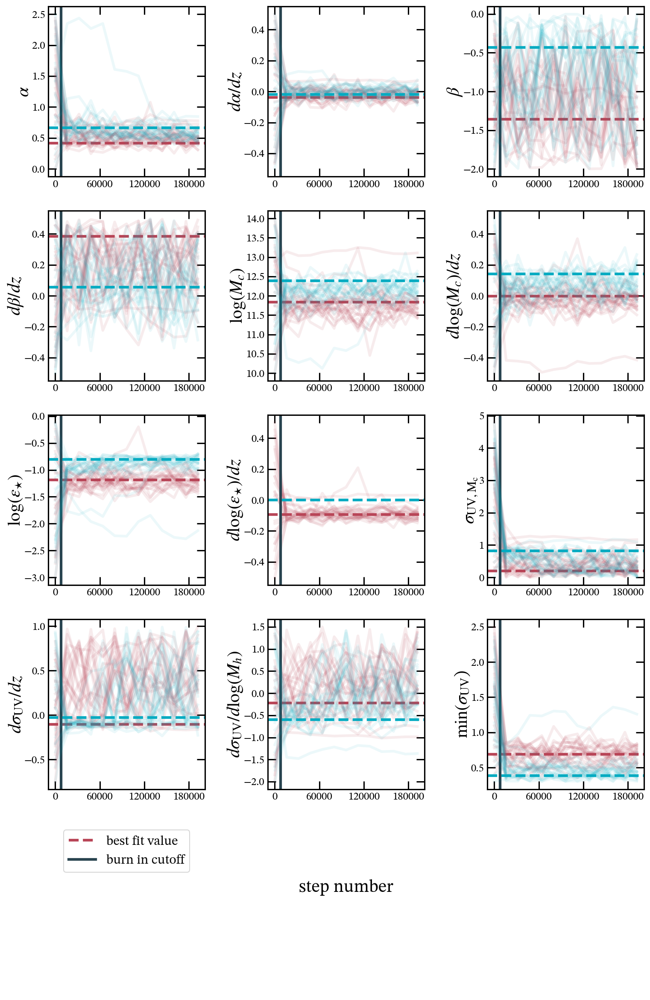

In [165]:
fig

In [166]:
fig.savefig('/Users/eb35267/Desktop/code/figures/beta_comparison/walker_comparison.png')

# Split the sample

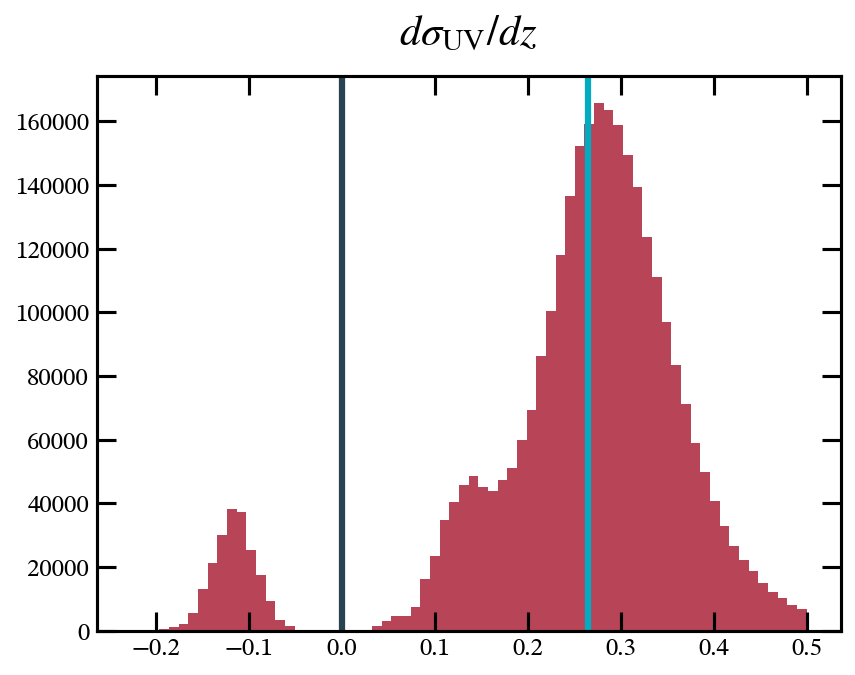

In [12]:
index = -2
fig, ax = plt.subplots()
hist = ax.hist(samples[:,index], bins = 70)
ax.set_title(param_labels[index])
ax.axvline(best_fit[index], color = eplots.turquoise)
ax.axvline(0, color = eplots.navy)

In [13]:
selected_idxs = samples[:,index] > 0
print(round(len(samples[selected_idxs])/1e6, 2))

2.86


In [61]:
# walker_fig = eplots.walkers(my_UVLF, best_fit, backend_file = file_name, ncols = 4)

In [62]:
# walker_fig.savefig('/Users/eb35267/Desktop/code/figures/two_fits/walkers.png')

In [14]:
samples_selected = samples[selected_idxs]
samples_not_selected = samples[~selected_idxs]

In [15]:
bounds_selected = np.percentile(samples_selected, [16, 84], axis = 0)
bounds_not_selected = np.percentile(samples_not_selected, [16, 84], axis = 0)

# Before I run the chain all over again for each of these I just want to see what picture the samples I already have paint

In [16]:
bf_selected = samples_selected[np.argmax(log_prob[selected_idxs])]

In [17]:
bf_selected

array([ 0.56929118, -0.70024757, 12.20361587,  0.0938183 , -0.71774452,
        0.27645909,  0.26520721, -0.13251424])

In [18]:
bf_not_selected = samples_not_selected[np.argmax(log_prob[~selected_idxs])]

In [19]:
bf_not_selected

array([ 5.97426437e-01, -8.20790927e-01,  1.17432691e+01, -4.61984273e-04,
       -8.87479718e-01,  3.26843515e-01, -1.29100048e-01, -1.02606774e-01])

/Users/eb35267/Desktop/code/repos/Zeus21/zeus21/UVLFs.py:33: RuntimeWarning: divide by zero encountered in log10
  MUVtab = 51.63 - 2.5 * np.log10(LUVtab) #AB magnitude
/Users/eb35267/Desktop/code/home/escripts/eplots.py:242: RuntimeWarning: divide by zero encountered in log10
  ax.vlines(xdat, np.clip(np.log10(ydat - yerr_lower), -100, 100), np.clip(np.log10(ydat + yerr_upper), -100, 100), ls = '-', colors = navy, linewidth =5)
/Users/eb35267/Desktop/code/home/escripts/eplots.py:242: RuntimeWarning: invalid value encountered in log10
  ax.vlines(xdat, np.clip(np.log10(ydat - yerr_lower), -100, 100), np.clip(np.log10(ydat + yerr_upper), -100, 100), ls = '-', colors = navy, linewidth =5)


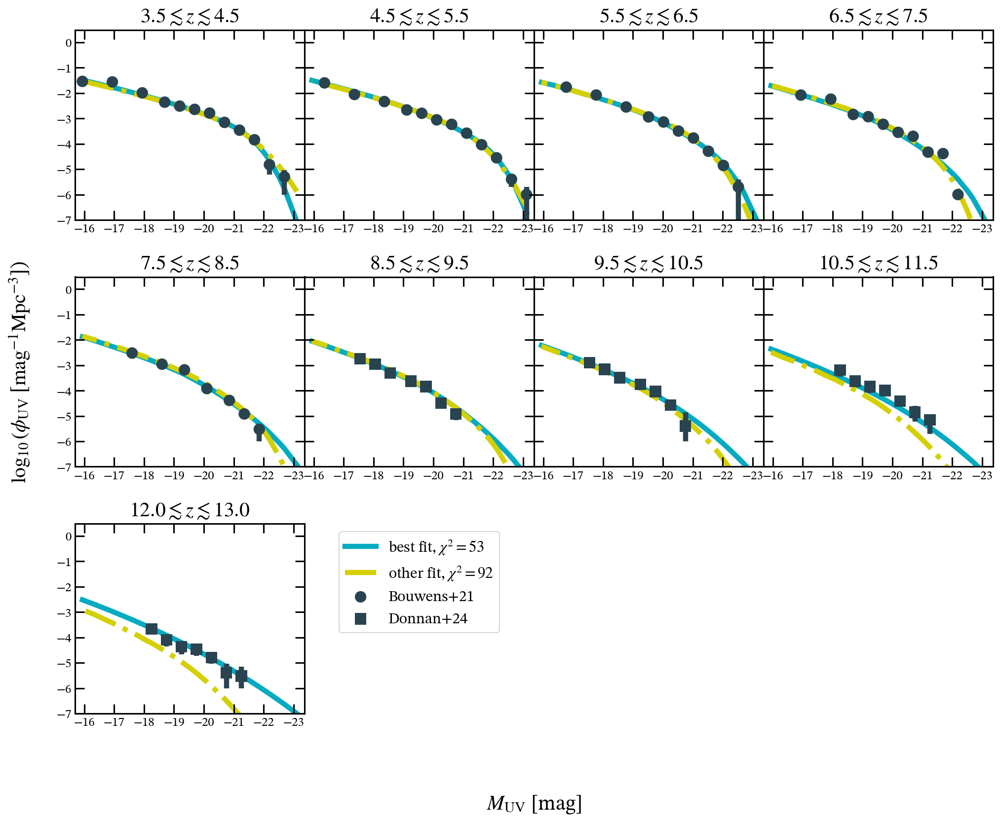

In [20]:
# z_plot = [4, 8, 14, 18]
# z_err = [0.5, 0.5, 0.5, 2]
ev_fig = eplots.evolving_UVLF_fit(my_UVLF, plot_from_chain = False, comparison_fits = [bf_selected, bf_not_selected], comparison_labels = ['best fit', 'other fit']) #, 
                                  #z_plot = z_plot, z_errs = z_err)

In [38]:
# ev_fig.savefig('/Users/eb35267/Desktop/code/figures/two_fits/UVLF_mode.png')

In [30]:
def compare_fits(samples, fit_labels, best_fits, param_labels, ncols = 3, alpha = 0.5, bounds = None):
    assert(all([len(sample[0]) == len(samples[0][0]) for sample in samples])), 'The samples provided have different numbers of parameters'
    assert(len(param_labels) == len(samples[0][0])), 'The number of parameters doesn\'t match the number of parameters in the sample'
    
    n = len(param_labels)
    fig = plt.figure()
    gs = GridSpec(math.ceil((n+1)/ ncols), ncols, figure=fig)
    plt.subplots_adjust(hspace = 0.5)
    
    axs=[]
    colors = [eplots.turquoise, eplots.yellow]
    for i, label in enumerate(param_labels):
        ax = fig.add_subplot(gs[math.floor(i/ncols), i%ncols])
        axs.append(ax)
        for sample, color, bf, fit_label in zip(samples, colors, best_fits, fit_labels):
            ax.hist(sample[:,i], alpha=alpha, density = False, label = fit_label, color = color)
            ax.axvline(bf[i], color = color, ls = 'dashed')
            ax.set_title(label)
        if bounds is not None:
            for bound, color in zip(bounds, colors):
                ax.axvline(bound[0][i], color = color, lw = 1,  ls = 'dotted')
                ax.axvline(bound[1][i], color = color, lw = 1,  ls = 'dotted')

    axs[0].plot(best_fits[0][0], 0, ls = 'dashed', color = 'black', label = 'best fit value')
    axs[0].plot(best_fits[0][0], 0, lw = 1, ls = 'dotted', color = 'black', label = 'upper/lower bounds')
    eplots.multicol(gs, axs, include_legend = True)

    return fig

In [31]:
ICs_selected = eMCMC.get_narrowed_ICs(my_UVLF, bf_selected, bounds_selected, labels = param_labels)

In [32]:
ICs_selected

(array([ 0.5392778 , -1.12374414, 11.90434941, -0.76113648,  0.02085882,
         0.22561212]),
 array([ 0.63455858, -0.68532635, 12.1150392 , -0.72494694,  0.17066545,
         0.2816223 ]))

In [33]:
ICs_not_selected = eMCMC.get_narrowed_ICs(my_UVLF, bf_not_selected, bounds_not_selected, param_labels)

In [34]:
ICs_not_selected

(array([ 0.48104743, -1.87153344, 11.74969443, -0.98106201,  0.25630221,
        -0.14638184]),
 array([ 0.55743006, -1.22248638, 11.94144881, -0.87704663,  0.38974393,
        -0.10332193]))

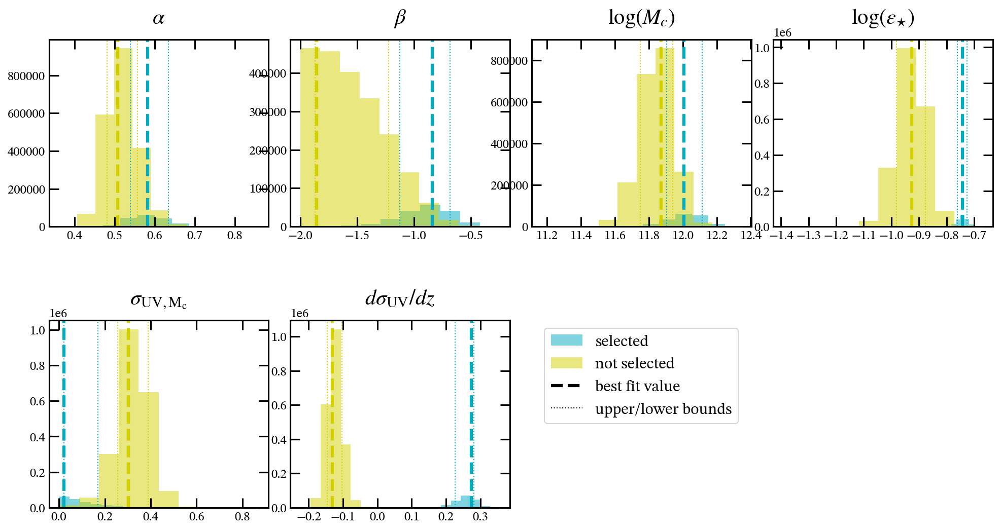

In [35]:
compare_fig = compare_fits([samples_selected, samples_not_selected], ['selected', 'not selected'], [bf_selected, bf_not_selected], param_labels, bounds = [ICs_selected, ICs_not_selected], ncols = 4)

In [45]:
bf_not_selected

array([ 1.01432533, -0.01510538, 11.4458372 ,  0.03496018, -1.09833539,
       -0.08365264,  0.28074026,  0.01695079, -1.12152869,  0.62748956])

In [26]:
# compare_fig.savefig('/Users/eb35267/Desktop/code/chains/just_HST/two_fits.png')

# Save figures corresponding to new fit

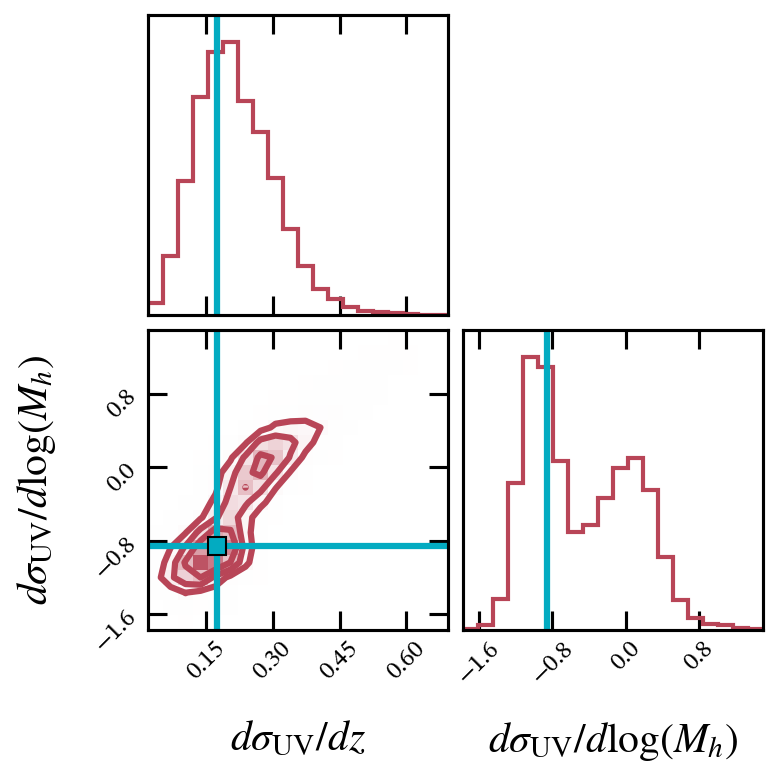

In [101]:
corner = eplots.make_corner(my_UVLF, samples = samples_selected, true_vals = bf_selected, include_params = ['dsigdz', 'dsigdlogM'])

In [102]:
corner.savefig(folder + '/corner_narrowed.png')

# Cut again

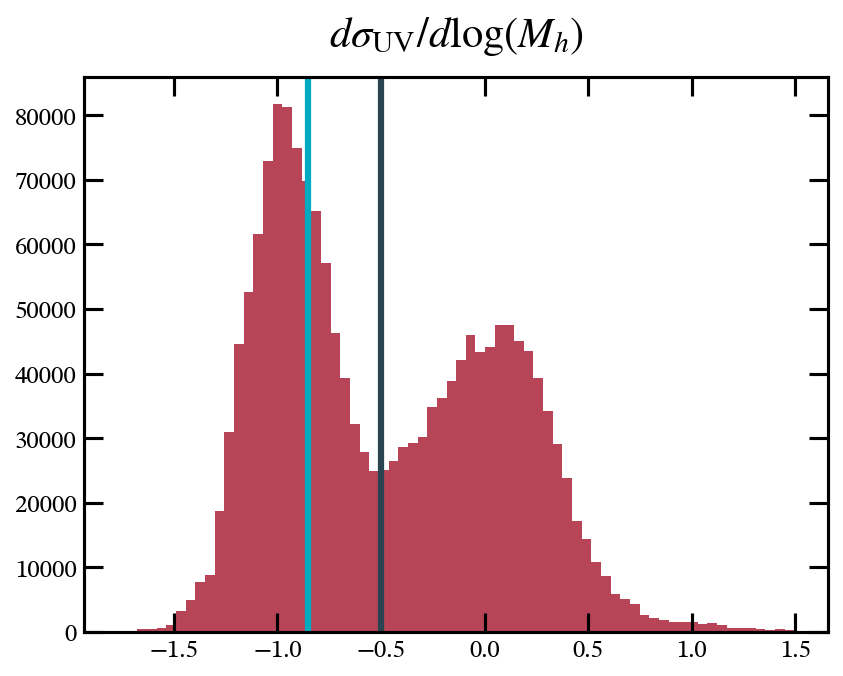

In [81]:
index = -2
fig, ax = plt.subplots()
hist = ax.hist(samples_selected[:,index], bins = 70)
ax.set_title(param_labels[index])
ax.axvline(bf_selected[index], color = eplots.turquoise)
ax.axvline(-0.5, color = eplots.navy)

In [82]:
double_selected_idxs = samples_selected[:,index] < -0.5
print(round(len(samples_selected[double_selected_idxs])/1e6, 2))

0.92


In [83]:
double_selected = samples_selected[double_selected_idxs]
single_selected = samples_selected[~double_selected_idxs]

In [85]:
bf_double = double_selected[np.argmax(log_prob[selected_idxs][double_selected_idxs])]
bf_single = single_selected[np.argmax(log_prob[selected_idxs][~double_selected_idxs])]

/Users/eb35267/Desktop/code/repos/Zeus21/zeus21/UVLFs.py:33: RuntimeWarning: divide by zero encountered in log10
  MUVtab = 51.63 - 2.5 * np.log10(LUVtab) #AB magnitude
/Users/eb35267/Desktop/code/home/escripts/eplots.py:242: RuntimeWarning: divide by zero encountered in log10
  ax.vlines(xdat, np.clip(np.log10(ydat - yerr_lower), -100, 100), np.clip(np.log10(ydat + yerr_upper), -100, 100), ls = '-', colors = navy, linewidth =5)
/Users/eb35267/Desktop/code/home/escripts/eplots.py:242: RuntimeWarning: invalid value encountered in log10
  ax.vlines(xdat, np.clip(np.log10(ydat - yerr_lower), -100, 100), np.clip(np.log10(ydat + yerr_upper), -100, 100), ls = '-', colors = navy, linewidth =5)


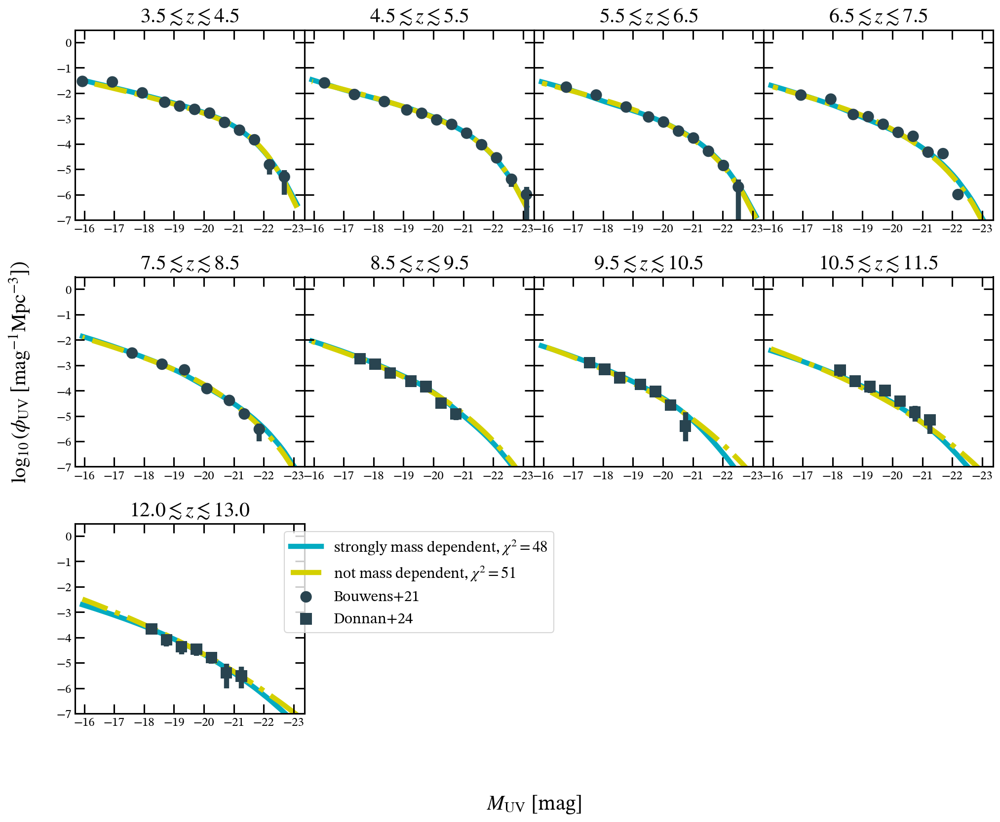

In [103]:
# z_plot = [4, 8, 14, 18]
# z_err = [0.5, 0.5, 0.5, 2]
ev_fig = eplots.evolving_UVLF_fit(my_UVLF, plot_from_chain = False, comparison_fits = [bf_double, bf_single], comparison_labels = ['strongly mass dependent', 'not mass dependent']) #, 
                                  #z_plot = z_plot, z_errs = z_err)

In [104]:
ev_fig.savefig(folder + '/UVLF_with_2_possibilites.png')

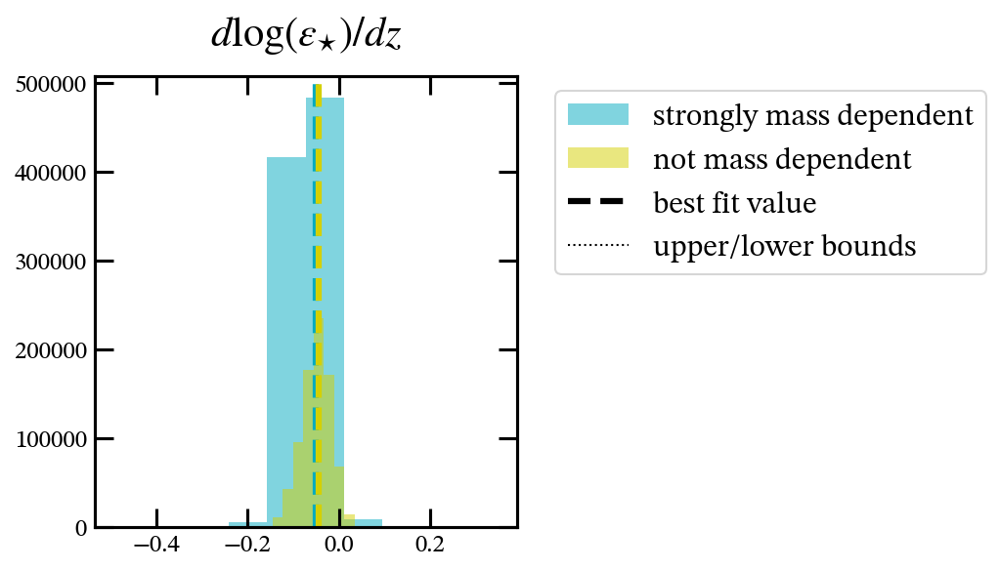

In [111]:
include_idxs = [5]

compare_fig = compare_fits([double_selected[:,include_idxs], single_selected[:,include_idxs]], ['strongly mass dependent', 'not mass dependent'], [bf_double[include_idxs], bf_single[include_idxs]], 
                           np.array(param_labels)[include_idxs], ncols = 4)

In [112]:
compare_fig.savefig(folder + '/fit_comparison_hist_dedz.png')

# Make table

In [56]:
isolate_data = np.hstack((samples_selected[:,8].reshape(-1, 1), samples_selected[:,7].reshape(-1, 1)))

In [70]:
fake_data = np.hstack((np.array([-10, -100]).reshape(-1, 1), np.array([-10, -100]).reshape(-1,1)))

In [75]:
my_UVLF.param_data

,fit,value,lower,upper,label
alpha,True,0.6,0,2.5,$\alpha$
dalphadz,True,0,-0.5,0.5,$d\alpha/dz$
beta,False,-1.49,-2,0,$\beta$
dbetadz,False,0.22,-0.5,0.5,$d\beta/dz$
logMc,True,12,10,14,$\log(M_c)$
dlogMcdz,True,0,-0.5,0.5,$d\log(M_c)/dz$
loge,True,-0.5,-3,0,$\log(\epsilon_{\star})$
dlogedz,True,0,-0.5,0.5,$d\log(\epsilon_{\star})/dz$
sig,True,0,0,5,"$\sigma_{\rm{UV}, M_c}$"
dsigdz,True,0,-0.75,1,$d\sigma_{\rm{UV}}/dz$


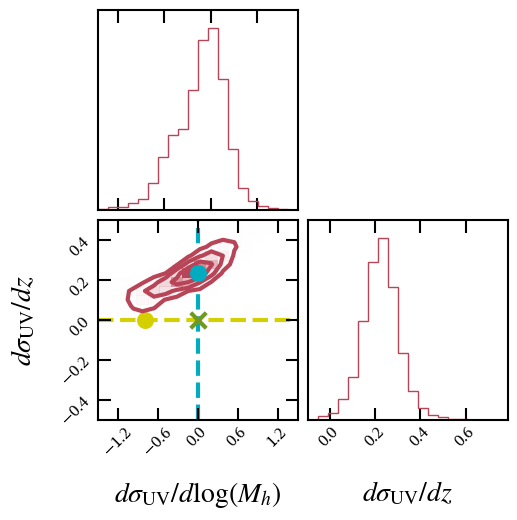

In [184]:
zoomed_corner = corner.corner(isolate_data, plot_contours = True, plot_datapoints = False, color = eplots.red, labels = [r'$d\sigma_{\rm{UV}}/d\log(M_{h})$', r'$d\sigma_{\rm{UV}}/dz$'])


zoomed_corner.axes[2].set_xlim(-1.5, 1.5)
zoomed_corner.axes[2].set_ylim(-0.5, 0.5)

ax2 = zoomed_corner.axes[2]

ax2.scatter(0, 0, marker = 'x', s=125, color = eplots.green)
ax2.axhline(0, color = eplots.yellow, lw = 3, ls = 'dashed', zorder = 0)
ax2.scatter(-0.796, 0, marker = 'o', s=125, color = eplots.yellow)
ax2.axvline(0, color = eplots.turquoise, lw = 3, ls = 'dashed', zorder = 0)
ax2.scatter(0, 0.236, marker = 'o', s=125, color = eplots.turquoise, zorder = 2)

In [185]:
zoomed_corner.savefig('/Users/eb35267/Desktop/figures/Qual_26/Talk/final_corner.png', dpi = 300)

In [110]:
table = eplots.make_table([bf_selected], param_labels, fit_labels = ['best fit'], bounds = [bounds_selected])

In [111]:
table

,best fit
$\alpha$,$0.531^{+0.26}_{-0.05}$
$d\alpha/dz$,$-0.001^{+0.05}_{-0.03}$
$\log(M_c)$,$11.712^{+0.12}_{-0.44}$
$d\log(M_c)/dz$,$-0.057^{+0.04}_{-0.08}$
$\log(\epsilon_{\star})$,$-1.338^{+0.06}_{-0.2}$
$d\log(\epsilon_{\star})/dz$,$-0.113^{+0.01}_{-0.03}$
"$\sigma_{\rm{UV}, M_c}$",$0.486^{+0.24}_{-0.11}$
$d\sigma_{\rm{UV}}/dz$,$0.229^{+0.07}_{-0.08}$
$d\sigma_{\rm{UV}}/d\log(M_{h})$,$-0.152^{+0.36}_{-0.48}$
$\min(\sigma_{\rm{UV}}$),$0.678^{+0.19}_{-0.06}$


In [53]:
dfi.export(table, folder + '/table_narrowed.png', table_conversion = 'matplotlib', use_mathjax = True, dpi = 200)